In [7]:
pip install accelerate lpips

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.8/53.8 kB 42.4 kB/s eta 0:00:00a 0:00:01
Note: you may need to restart the kernel to use updated packages.


In [8]:
pip install git+https://github.com/openai/CLIP.git

  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-03g5nq3h
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-03g5nq3h
  Resolved https://github.com/openai/CLIP.git to commit dcba3cb2e2827b402d2701e7e1c7d9fed8a20ef1
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 1.7 MB/s eta 0:00:00
  Created wheel for clip: filename=clip-1.0-py3-none-any.whl size=1369489 sha256=e8325e538db6fbf53276e55e3069a0da193164a2918a40d1514940fce277cc6e
  Stored in directory: /tmp/pip-ephem-wheel-cache-j29rv9ft/wheels/da/2b/4c/d6691fa9597aac8bb85d2ac13b112deb897d5b50f5ad9a37e4
Successfully built clip
Note: you may need to restart the kernel to use updated packages.


## Initializing

In [9]:
# Стандартная библиотека
import os
import re
from typing import List, Tuple

# Сторонние библиотеки
import cv2
import lpips
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch
import torchvision.transforms as transforms
from PIL import Image
from sklearn.metrics.pairwise import cosine_similarity
from skimage.metrics import structural_similarity as ssim
from tqdm import tqdm

# Transformers и обработка текста
import clip
import tiktoken
from transformers import (
    AutoModelForCausalLM,
    AutoTokenizer,
    CLIPModel,
    CLIPProcessor,
)

# Diffusers и модели генерации
from diffusers import (
    AutoPipelineForImage2Image,
    DDIMScheduler,
    LCMScheduler,
    StableDiffusion3Pipeline,
    StableDiffusionPipeline,
)
from diffusers.utils import load_image, make_image_grid

# Torch и нейросетевые модули
from torch import nn
from torch.nn import functional as F
from torchvision import models

# Датсеты
from datasets import load_dataset

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

In [13]:
def critic(prompt,tokenizer,model):
  
    base_prompt = f'''You get info about the story: Actions, Location, Characters
                    If everything looks correct, answer: YES, else NO
                    ANSWER ONLY YES OR NO
                    INFO:{prompt}'''
    messages = [
        {"role": "system", "content": "You're a critic. You're best in it"},
        {"role": "user", "content": base_prompt}
    ]

    # Применение шаблона чата
    text = tokenizer.apply_chat_template(
        messages,
        tokenize=False,
        add_generation_prompt=True
    )

    # Подготовка входных данных для модели
    model_inputs = tokenizer([text], return_tensors="pt").to(model.device)

    # Генерация ответа
    generated_ids = model.generate(
        **model_inputs,
        max_new_tokens=64
    )

    # Извлечение сгенерированного текста
    generated_ids = [
        output_ids[len(input_ids):] for input_ids, output_ids in zip(model_inputs.input_ids, generated_ids)
    ]

    response = tokenizer.batch_decode(generated_ids, skip_special_tokens=True)[0]
    return response

In [14]:
def story_deepthink(prompt,tokenizer,model):
  
    base_prompt = f'''You've got the text of the story. You should think about it
                    You should in details describe the location and characters of this story
                    And describe the actions of the story.
                    Do it maximum illustrative
                    Story:{prompt}'''
    messages = [
        {"role": "system", "content": "You're a thinker. You're best in it"},
        {"role": "user", "content": base_prompt}
    ]

    # Применение шаблона чата
    text = tokenizer.apply_chat_template(
        messages,
        tokenize=False,
        add_generation_prompt=True
    )

    # Подготовка входных данных для модели
    model_inputs = tokenizer([text], return_tensors="pt").to(model.device)

    # Генерация ответа
    generated_ids = model.generate(
        **model_inputs,
        max_new_tokens=64
    )

    # Извлечение сгенерированного текста
    generated_ids = [
        output_ids[len(input_ids):] for input_ids, output_ids in zip(model_inputs.input_ids, generated_ids)
    ]

    response = tokenizer.batch_decode(generated_ids, skip_special_tokens=True)[0]
    return response

In [ ]:
def location_desсriber(prompt, location, tokenizer, model):
  
    base_prompt = f'''You've got the text of the story.
                    You should describe the {location} in this story this story
                    You can imagine how it looks like
                    Do it briefly
                    Story:{prompt}'''
    messages = [
        {"role": "system", "content": "You're a painter. You're best in it"},
        {"role": "user", "content": base_prompt}
    ]

    # Применение шаблона чата
    text = tokenizer.apply_chat_template(
        messages,
        tokenize=False,
        add_generation_prompt=True
    )

    # Подготовка входных данных для модели
    model_inputs = tokenizer([text], return_tensors="pt").to(model.device)

    # Генерация ответа
    generated_ids = model.generate(
        **model_inputs,
        max_new_tokens=64
    )

    # Извлечение сгенерированного текста
    generated_ids = [
        output_ids[len(input_ids):] for input_ids, output_ids in zip(model_inputs.input_ids, generated_ids)
    ]

    response = tokenizer.batch_decode(generated_ids, skip_special_tokens=True)[0]
    return response

In [16]:
def location_finder(prompt,tokenizer,model):
  
    base_prompt = f'''You've got the text of the story.
                    Write a locations in which the actions in the story take place.
                    Highlight locations and write them with commas.
                    Be as concise as possible and do not write any extra words or characters or you will be punished
                    ONLY 1 WORD PER LOCATION
                    ACTION:{prompt}'''
    messages = [
        {"role": "system", "content": "You're a painter. You're best in it"},
        {"role": "user", "content": base_prompt}
    ]

    # Применение шаблона чата
    text = tokenizer.apply_chat_template(
        messages,
        tokenize=False,
        add_generation_prompt=True
    )

    # Подготовка входных данных для модели
    model_inputs = tokenizer([text], return_tensors="pt").to(model.device)

    # Генерация ответа
    generated_ids = model.generate(
        **model_inputs,
        max_new_tokens=64
    )

    # Извлечение сгенерированного текста
    generated_ids = [
        output_ids[len(input_ids):] for input_ids, output_ids in zip(model_inputs.input_ids, generated_ids)
    ]

    response = tokenizer.batch_decode(generated_ids, skip_special_tokens=True)[0]
    return response

In [17]:
def location_matcher(prompt, location,tokenizer, model):
  
    base_prompt = f'''You've got the action and locations.
                    Write a location in which this actions may take place.
                    
                    ACTION:{prompt}
                    LOCATIONS:{location}
                    CHOOSE ONLY ONE LOCATION FROM A LIST DO NOT WRITE OTHER WORDS
                    USE WORDS FROM A LIST DO NOT CHANGE THEM
                    '''
    messages = [
        {"role": "system", "content": "You're a writer. You're best in it"},
        {"role": "user", "content": base_prompt}
    ]

    # Применение шаблона чата
    text = tokenizer.apply_chat_template(
        messages,
        tokenize=False,
        add_generation_prompt=True
    )

    # Подготовка входных данных для модели
    model_inputs = tokenizer([text], return_tensors="pt").to(model.device)

    # Генерация ответа
    generated_ids = model.generate(
        **model_inputs,
        max_new_tokens=64
    )

    # Извлечение сгенерированного текста
    generated_ids = [
        output_ids[len(input_ids):] for input_ids, output_ids in zip(model_inputs.input_ids, generated_ids)
    ]

    response = tokenizer.batch_decode(generated_ids, skip_special_tokens=True)[0]
    return response

In [18]:
def char_desсriber(prompt,tokenizer, model):
  
    base_prompt = f'''You've got the text of the story.
                    You should list the characters
                    Do not use names, descrivbe them in general according their roles
                    Do not use extra words and symbols
                    Story:{prompt}'''
    messages = [
        {"role": "system", "content": "You're a writer. You're best in it"},
        {"role": "user", "content": base_prompt}
    ]

    # Применение шаблона чата
    text = tokenizer.apply_chat_template(
        messages,
        tokenize=False,
        add_generation_prompt=True
    )

    # Подготовка входных данных для модели
    model_inputs = tokenizer([text], return_tensors="pt").to(model.device)

    # Генерация ответа
    generated_ids = model.generate(
        **model_inputs,
        max_new_tokens=64
    )

    # Извлечение сгенерированного текста
    generated_ids = [
        output_ids[len(input_ids):] for input_ids, output_ids in zip(model_inputs.input_ids, generated_ids)
    ]

    response = tokenizer.batch_decode(generated_ids, skip_special_tokens=True)[0]
    return response

In [19]:
def describe_story(prompt,tokenizer, model):
  
    base_prompt = f'''You get a story to input.
                      Your task is to write the description for the Characters and the Location.
                      You can imagine them
                      Describe it briefly in details
                      WRITE ONLY DESCRIPTIONS!!!
                      Text to be processed:{prompt}'''
    messages = [
        {"role": "system", "content": "You're a professional writer. You're best in it"},
        {"role": "user", "content": base_prompt}
    ]

    # Применение шаблона чата
    text = tokenizer.apply_chat_template(
        messages,
        tokenize=False,
        add_generation_prompt=True
    )

    # Подготовка входных данных для модели
    model_inputs = tokenizer([text], return_tensors="pt").to(model.device)

    # Генерация ответа
    generated_ids = model.generate(
        **model_inputs,
        max_new_tokens=70
    )

    # Извлечение сгенерированного текста
    generated_ids = [
        output_ids[len(input_ids):] for input_ids, output_ids in zip(model_inputs.input_ids, generated_ids)
    ]

    response = tokenizer.batch_decode(generated_ids, skip_special_tokens=True)[0]
    return response

In [ ]:
def generate_response(prompt,tokenizer, model, parts = 3):
  
    base_prompt = f'''  You need to divide the text ONLY into {parts} actions and describe them, ONLY {parts}, NOT MORE!!!!
                        Seperate each main ACTION and begin with token '[ACTION]'
                        Do not use any characters except letters, numbers, and the dot and comma sign.
                        DO NOT USE OTHER TOKENS!!!!
                        THERE ARE MUST BE ONLY {parts} PARTS!!!!
                        Text to be processed:{prompt}'''
    messages = [
        {"role": "system", "content": "You're a professional text writer. You're best in it"},
        {"role": "user", "content": base_prompt}
    ]

    # Применение шаблона чата
    text = tokenizer.apply_chat_template(
        messages,
        tokenize=False,
        add_generation_prompt=True
    )

    # Подготовка входных данных для модели
    model_inputs = tokenizer([text], return_tensors="pt").to(model.device)

    # Генерация ответа
    generated_ids = model.generate(
        **model_inputs,
        max_new_tokens=64
    )

    # Извлечение сгенерированного текста
    generated_ids = [
        output_ids[len(input_ids):] for input_ids, output_ids in zip(model_inputs.input_ids, generated_ids)
    ]

    response = tokenizer.batch_decode(generated_ids, skip_special_tokens=True)[0]
    return response

def clean_text(text):
    # Регулярное выражение для оставления только букв, цифр, точек и запятых
    cleaned_text = re.sub(r"[^][a-zA-Z0-9 .,]", "", text)
    return cleaned_text

def merge_actions(actions, num=3):
    if len(actions) <= num:
        return actions
    else:
        # Если частей больше 3, объединяем их равномерно
        step = len(actions) // num  # Определяем шаг для объединения
        merged_actions = [
            " ".join(actions[i:i + step]) for i in range(0, len(actions), step)
        ]
        # Если после объединения осталось больше 3 частей, объединяем последние
        if len(merged_actions) > num:
            merged_actions[2] += " " + " ".join(merged_actions[num:])
            merged_actions = merged_actions[:num]
        return merged_actions


## Full Pipeline

In [21]:
def calculate_clip_score(image: str, text: str, model_name: str = "ViT-B/32") -> float:
    """
    Вычисляет CLIP Score — меру соответствия между изображением и текстом.
    
    Параметры:
        image_path (str): Путь к изображению.
        text (str): Текст для сравнения.
        model_name (str): Название модели CLIP (по умолчанию "ViT-B/32").
    
    Возвращает:
        float: Значение CLIP Score (косинусное сходство между эмбеддингами).
    """
    # Загрузка модели и предобработки
    device = "cuda" if torch.cuda.is_available() else "cpu"
    model, preprocess = clip.load(model_name, device=device)
    
    # Загрузка и предобработка изображения
    image = preprocess(image).unsqueeze(0).to(device)
    
    # Токенизация текста
    text_tokens = clip.tokenize([text]).to(device)
    
    # Вычисление эмбеддингов
    with torch.no_grad():
        image_features = model.encode_image(image)
        text_features = model.encode_text(text_tokens)
    
    # Косинусное сходство
    clip_score = torch.cosine_similarity(image_features, text_features).item()
    
    return clip_score

In [22]:
def calculate_lpips(image_path1: str, image_path2: str, net_type: str = 'alex') -> float:
    """
    Вычисляет метрику LPIPS между двумя изображениями.

    Параметры:
        image_path1 (str): Путь к первому изображению.
        image_path2 (str): Путь ко второму изображению.
        net_type (str): Модель для вычисления ('alex', 'vgg', 'squeeze').

    Возвращает:
        float: Значение LPIPS (чем меньше, тем более схожи изображения).
    """
    # Инициализация LPIPS
    loss_fn = lpips.LPIPS(net=net_type).eval()
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    loss_fn.to(device)

    def load_image(path):
        img = path#Image.open(path).convert('RGB')
        transform = transforms.Compose([
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
        ])
        return transform(img).unsqueeze(0).to(device)

    img1 = load_image(image_path1)
    img2 = load_image(image_path2)

    # Расчет LPIPS
    with torch.no_grad():
        distance = loss_fn(img1, img2).item()

    return distance

# Единичные прогоны

### LLM Агенты

In [23]:
def location_finder(prompt,tokenizer,model):
  
    base_prompt = f'''You've got the text of the story.
                    Write a locations in which the actions in the story take place.
                    Be brief as possible and write locations with commas
                    WRITE ONLY LOCATIONS DO NOT WRITE EXTRA WORDS
                    STORY:{prompt}'''
    messages = [
        {"role": "system", "content": "You're a painter. You're best in it"},
        {"role": "user", "content": base_prompt}
    ]

    # Применение шаблона чата
    text = tokenizer.apply_chat_template(
        messages,
        tokenize=False,
        add_generation_prompt=True
    )

    # Подготовка входных данных для модели
    model_inputs = tokenizer([text], return_tensors="pt").to(model.device)

    # Генерация ответа
    generated_ids = model.generate(
        **model_inputs,
        max_new_tokens=64
    )

    # Извлечение сгенерированного текста
    generated_ids = [
        output_ids[len(input_ids):] for input_ids, output_ids in zip(model_inputs.input_ids, generated_ids)
    ]

    response = tokenizer.batch_decode(generated_ids, skip_special_tokens=True)[0]
    return response

In [24]:
def parse_characters(input_str):
    # Удаляем заголовок "Characters:" (регистронезависимо)
    input_str = re.sub(r'^.*characters:.*$', '', input_str, flags=re.IGNORECASE | re.MULTILINE)
    
    # Находим все элементы списка
    entries = re.findall(r'^\s*-\s*(.*?)\s*$', input_str, flags=re.MULTILINE)
    
    # Очистка и форматирование каждого элемента
    cleaned_entries = []
    for entry in entries:
        # Удаляем лишние символы, кроме букв, цифр, пробелов и скобок
        entry = re.sub(r'[^\w\s()]', '', entry)
        # Убираем лишние пробелы
        entry = re.sub(r'\s+', ' ', entry).strip()
        # Приводим к Title Case (первые буквы слов заглавные)
        entry = entry.title()
        cleaned_entries.append(entry)
    
    return ', '.join(cleaned_entries)

In [25]:
def parse_actions(input_str):
    # Разделяем по [ACTION] в любом регистре
    actions = re.split(r'\[ACTION\]', input_str, flags=re.IGNORECASE)
    
    # Очищаем от пустых строк и лишних пробелов
    cleaned_actions = [action.strip() for action in actions if action.strip()]
    
    return cleaned_actions

In [26]:
def create_story_report(story_ls: list, characters: list, location_ls: list) -> str:
    """
    Объединяет списки сюжетов, персонажей и локаций в форматированный текстовый отчет.
    
    Параметры:
        story_ls: Список сюжетных событий
        characters: Список персонажей (с атрибутами)
        location_ls: Список локаций
    
    Возвращает:
        str: Форматированный текстовый отчет
    """
    # Заголовок и сюжет
    report = "📖 СЮЖЕТНЫЕ СОБЫТИЯ:\n"
    report += "\n".join(f"→ {i+1}. {story}" for i, story in enumerate(story_ls))
    
    # Персонажи
    report += "\n\n🎭 ПЕРСОНАЖИ:\n"
    if isinstance(characters, dict):  # Если characters - словарь
        report += "\n".join(f"• {name}: {desc}" for name, desc in characters.items())
    else:  # Если characters - список
        report += "\n".join(f"• {char}" for char in characters)
    
    # Локации
    report += "\n\n🌍 ЛОКАЦИИ:\n"
    unique_locations = list(set(location_ls))  # Уникальные локации
    report += "\n".join(f"📍 {loc}" for loc in unique_locations)
    
    
    return report

In [27]:
def llm_agents(story: str,tokenizer, model) -> Tuple[List[str], dict, List[str]]:
    """Генерация согласованных story_ls и location_ls с контролем длины токенов."""
    enc = tiktoken.get_encoding("cl100k_base")
    
    def count_tokens(text: str) -> int:
        return len(enc.encode(text))

    # 1. Получение персонажей (без ограничений токенов)
    characters = parse_characters(char_desсriber(story,tokenizer, model))
    
    # 2. Генерация story_ls (макс 3 попытки)
    story_ls = []
    for _ in range(3):
        story_ls = merge_actions(parse_actions(generate_response(story,tokenizer, model)))
        if all(count_tokens(item) < 77 for item in story_ls):
            break
    else:
        story_ls = [s[:70] + "..." for s in story_ls]  # Принудительная обрезка
    
    # 3. Генерация location_ls (макс 3 попытки)
    locations_raw = location_finder(story,tokenizer, model)
    location_ls = []
    
    for attempt in range(3):
        location_ls = []
        for story_item in story_ls:
            loc = location_matcher(story_item, locations_raw,tokenizer, model)
            location_ls.append(loc[:70] + "..." if count_tokens(loc) >= 77 else loc)
        
        # Корректировка длины
        if len(location_ls) != len(story_ls):
            diff = len(story_ls) - len(location_ls)
            filler = location_ls[0] if len(set(location_ls)) == len(location_ls) else location_ls[-1]
            location_ls.extend([filler] * diff)
        
        # Проверка успешности
        if (len(location_ls) == len(story_ls) and 
            all(count_tokens(loc) < 77 for loc in location_ls)):
            if 'yes' in critic(create_story_report(story_ls, characters, location_ls),tokenizer, model).lower():
                break
    
    # Финальные гарантии
    story_ls = [s if count_tokens(s) < 77 else s[:70] + "..." for s in story_ls]
    location_ls = location_ls[:len(story_ls)]
    location_ls = [loc if count_tokens(loc) < 77 else loc[:70] + "..." 
                  for loc in location_ls]
    
    return story_ls, characters, location_ls

In [28]:
#negative_prompt = 'poorly Rendered face, poorly drawn face ,poor facial details, poorly drawn hands, poorly rendered hands,low resolution, blurry image, disfigured, oversaturated, bad anatomy, deformed body features'

In [29]:
def generate_best_character_image(pipeline, characters: str, generator, empty_image, show_results: bool = False) -> Image.Image:
    """
    Генерирует 3 изображения персонажа и возвращает лучшее по CLIP Score.
    
    Параметры:
        pipeline: Пайплайн для генерации изображений
        characters (str): Описание персонажа
        generator: Генератор для воспроизводимости
        empty_image: Изображение для IP-адаптера
        show_results (bool): Показывать все варианты (по умолчанию False)
    
    Возвращает:
        Image.Image: Лучшее изображение по CLIP Score
    """
    pipeline.set_ip_adapter_scale(0)
    
    # Генерация 3 вариантов
    generated_images = []
    clip_scores = []
    
    for i in range(3):
        char_img = pipeline(
            prompt=f'Illustration {characters}',
            ip_adapter_image=empty_image,
            negative_prompt="lowres, bad anatomy, worst quality, low quality",
            num_inference_steps=50,
            generator=generator,
        ).images[0]
        
        score = calculate_clip_score(char_img, characters)
        generated_images.append(char_img)
        clip_scores.append(score)
        
        if show_results:
            plt.figure(figsize=(5, 5))
            plt.imshow(char_img)
            plt.title(f"Вариант {i+1} - CLIP: {score:.4f}")
            plt.axis('off')
            plt.show()
    
    # Выбор лучшего изображения
    best_idx = np.argmax(clip_scores)
    best_image = generated_images[best_idx]
    best_score = clip_scores[best_idx]
    
    print(f"Лучший CLIP Score: {best_score:.4f} (вариант {best_idx+1})")
    
    if show_results:
        plt.figure(figsize=(6, 6))
        plt.imshow(best_image)
        plt.title(f"Лучший результат - CLIP: {best_score:.4f}")
        plt.axis('off')
        plt.show()
    
    return best_image



In [30]:
def generate_backgrounds_with_quality_check(
    pipeline,
    characters: str,
    location_ls: list,
    char_image: Image.Image,
    generator,
    negative_prompt: str = "lowres, bad anatomy, worst quality, low quality",
    min_lpips_quality: float = 0.5,
    max_attempts: int = 3
) -> dict:
    """
    Генерирует фоны для локаций с проверкой качества через LPIPS.
    
    Параметры:
        pipeline: Пайплайн для генерации изображений
        characters (str): Описание персонажа
        location_ls: Список уникальных локаций
        char_image: Изображение персонажа для сравнения
        generator: Генератор для воспроизводимости
        negative_prompt: Негативный промпт
        min_lpips_quality: Минимальное требуемое качество (1 - LPIPS)
        max_attempts: Максимальное число попыток генерации
    
    Возвращает:
        dict: Словарь {локация: Image} с гарантированным качеством
    """
    pipeline.set_ip_adapter_scale(0.2)
    background_dict = {}
    
    for loc in list(set(location_ls)):
        for attempt in range(max_attempts):
            # Генерация фона
            background = pipeline(
                prompt=f'High-quality illustration of {characters} in {loc}',
                ip_adapter_image=char_image,
                negative_prompt=negative_prompt,
                num_inference_steps=50,
                generator=generator,
            ).images[0]
            
            # Проверка качества
            lpips_score = calculate_lpips(char_image, background)
            quality = 1 - lpips_score
            
            if quality >= min_lpips_quality:
                background_dict[loc] = background
                print(f"✓ Локация '{loc}': качество {quality:.4f} (попытка {attempt+1})")
                break
                
            print(f"× Локация '{loc}': качество {quality:.4f} < {min_lpips_quality} (попытка {attempt+1})")
            
            if attempt == max_attempts - 1:
                background_dict[loc] = background  # Сохраняем лучший из неудачных вариантов
                print(f"⚠ Для локации '{loc}' достигнут максимум попыток. Лучшее качество: {quality:.4f}")
    
    # Визуализация результатов
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(char_image)
    plt.title("Персонаж")
    plt.axis('off')
    
    plt.subplot(1, 2, 2)
    first_loc = next(iter(background_dict))
    plt.imshow(background_dict[first_loc])
    plt.title(f"Фон: {first_loc}\nLPIPS качество: {1 - calculate_lpips(char_image, background_dict[first_loc]):.4f}")
    plt.axis('off')
    
    plt.show()
    
    return background_dict



In [33]:
def generate_best_story_frames(
    pipeline,
    story_ls: list,
    location_ls: list,
    background_dict: dict,
    characters: str,
    generator,
    negative_prompt: str = "lowres, bad anatomy, worst quality, low quality",
    num_variants: int = 3,
    min_lpips: float = 0.5,
    display: bool = True,
    ip_adapter_scale: float = 0.2,
) -> list:
    """
    Генерирует лучшие кадры для историй с двойной проверкой качества (CLIP + LPIPS).
    
    Параметры:
        pipeline: Пайплайн генерации
        story_ls: Список историй
        location_ls: Список соответствующих локаций
        background_dict: Словарь фонов {локация: Image}
        characters: Описание персонажей
        generator: Генератор для воспроизводимости
        negative_prompt: Негативный промпт
        num_variants: Количество вариантов на историю
        min_lpips: Минимальное требование к LPIPS (1 - расстояние)
        display: Показывать результаты
    
    Возвращает:
        list: Лучшие изображения для каждой истории
    """
    pipeline.set_ip_adapter_scale(ip_adapter_scale)
    best_frames = []
    best_clips = []
    best_lpips = []
    
    for i, (story, loc) in enumerate(zip(story_ls, location_ls)):
        top_candidates = []
        
        # Генерация вариантов
        for _ in range(num_variants):
            img = pipeline(
                prompt=f'Illustration: {story} with {characters}',
                ip_adapter_image=background_dict.get(loc),
                negative_prompt=negative_prompt,
                num_inference_steps=50,
                generator=generator,
            ).images[0]
            
            # Вычисление метрик
            clip_score = calculate_clip_score(img, story)
            lpips_dist = calculate_lpips(background_dict[loc], img)
            lpips_quality = 1 - lpips_dist
            
            top_candidates.append({
                'image': img,
                'clip': clip_score,
                'lpips': lpips_quality,
                'combined_score': clip_score * (lpips_quality if lpips_quality >= min_lpips else 0)
            })
        
        # Выбор лучшего по комбинированному score
        top_candidates.sort(key=lambda x: x['combined_score'], reverse=True)
        best = top_candidates[0]
        best_frames.append(best['image'])
        best_clips.append(best['clip'])
        best_lpips.append(best['lpips'])
        if display:
            print(f"История {i+1}:")
            print(f"  CLIP: {best['clip']:.4f} | LPIPS: {best['lpips']:.4f}")
            print(f"  Текст: {story[:50]}...")
    
    # Визуализация
    if display:
        plt.figure(figsize=(20, 5))
        for idx, img in enumerate(best_frames):
            plt.subplot(1, len(best_frames), idx + 1)
            plt.imshow(img)
            plt.title(f"Кадр {idx+1}\n{story_ls[idx][:30]}...")
            plt.axis("off")
        plt.tight_layout()
        plt.show()
    
    return best_frames, best_clips, best_lpips

In [31]:
def save_images(image_list, num_act, output_dir="output_images", prefix="frame"):
    """
    Сохраняет список изображений в указанную директорию
    
    :param image_list: Список объектов PIL.Image
    :param output_dir: Папка для сохранения (по умолчанию "output_images")
    :param prefix: Префикс имен файлов (по умолчанию "frame")
    """
    # Создаем папку, если ее нет
    os.makedirs(output_dir, exist_ok=True)
    
    for i, img in enumerate(image_list):
        # Формируем имя файла: frame_1.jpg, frame_2.jpg и т.д.
        filename = f"{prefix}_{str(num_act)}_{i+1}.jpg"
        filepath = os.path.join(output_dir, filename)
        
        # Сохраняем изображение в формате JPEG
        img.save(filepath, "JPEG", quality=95)
        print(f"Сохранено: {filepath}")

In [35]:
def gen_img(text,
           use_lora = True):

    ## LLM
    model_name = "Qwen/Qwen2.5-1.5B-Instruct" 
    tokenizer = AutoTokenizer.from_pretrained(model_name)
    model = AutoModelForCausalLM.from_pretrained(model_name, device_map="cuda").to("cuda")
    
    ## Stable Diffusion
    pipeline = StableDiffusionPipeline.from_pretrained(
        "stable-diffusion-v1-5/stable-diffusion-v1-5",
        torch_dtype=torch.float16,
    ).to("cuda")
    
    pipeline.scheduler = DDIMScheduler.from_config(pipeline.scheduler.config)
    pipeline.load_ip_adapter("h94/IP-Adapter", subfolder="models", weight_name="ip-adapter_sd15.bin")
    
    pipeline.set_ip_adapter_scale(0.2)

    if use_lora:
        pipeline.scheduler = LCMScheduler.from_config(pipeline.scheduler.config)
        pipeline.load_lora_weights("/kaggle/input/load-lora-weights-pipe-unet-load-attn-procs/out/")
        pipeline.fuse_lora()
    
    # Создание пустого изображения
    #empty_image = Image.new("RGB", (512, 512), (255, 255, 255))  # Белый фон, размер 512x512
    width, height = 512, 512
    
    # Создаем массив случайных значений (шум) в диапазоне [0, 255]
    empty_image = np.random.randint(0, 256, (height, width, 3), dtype=np.uint8)
    
    generator = torch.Generator(device="cpu").manual_seed(26)

    story_ls, characters, location_ls = llm_agents(stories[i],tokenizer, model)
    
    story_report = create_story_report(
                                    story_ls=story_ls,
                                    characters=characters,
                                    location_ls=location_ls)

    best_char_image = generate_best_character_image(
                                                    pipeline=pipeline,
                                                    characters=characters,
                                                    generator=generator,
                                                    empty_image=empty_image,
                                                    show_results=True)

    background_dict = generate_backgrounds_with_quality_check(
                                                            pipeline=pipeline,
                                                            characters=characters,
                                                            location_ls=location_ls,
                                                            char_image=best_char_image,
                                                            generator=generator,
                                                            min_lpips_quality=0.5)

    best_frames, best_clips, best_lpips = generate_best_story_frames(
                                                                    pipeline=pipeline,
                                                                    story_ls=story_ls,
                                                                    location_ls=location_ls,
                                                                    background_dict=background_dict,
                                                                    characters=characters,
                                                                    generator=generator)
    
    return best_frames, best_clips, best_lpips
        

## Полный Pipeline

In [29]:
from datasets import load_dataset

# Загрузка датасета
ds = load_dataset("roneneldan/TinyStories")

# Извлечение первых 100 историй из тренировочного набора данных
stories = ds['train']['text'][:100]

# Удаление датасета для освобождения памяти (опционально)
del ds

README.md:   0%|          | 0.00/1.06k [00:00<?, ?B/s]

(…)-00000-of-00004-2d5a1467fff1081b.parquet:   0%|          | 0.00/249M [00:00<?, ?B/s]

(…)-00001-of-00004-5852b56a2bd28fd9.parquet:   0%|          | 0.00/248M [00:00<?, ?B/s]

(…)-00002-of-00004-a26307300439e943.parquet:   0%|          | 0.00/246M [00:00<?, ?B/s]

(…)-00003-of-00004-d243063613e5a057.parquet:   0%|          | 0.00/248M [00:00<?, ?B/s]

(…)-00000-of-00001-869c898b519ad725.parquet:   0%|          | 0.00/9.99M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/2119719 [00:00<?, ? examples/s]

Generating validation split:   0%|          | 0/21990 [00:00<?, ? examples/s]

## C IP

In [12]:
from datasets import load_dataset

# Загрузка датасета
ds = load_dataset("roneneldan/TinyStories")

# Извлечение первых 100 историй из тренировочного набора данных
stories = ds['train']['text'][:20]

# Удаление датасета для освобождения памяти (опционально)
del ds

In [13]:
def generate_response(prompt,tokenizer, model, parts = 3):
  
    base_prompt = f'''  You need to divide the text ONLY into {parts} actions and describe them, ONLY {parts}, NOT MORE!!!!
                        Seperate each main ACTION and begin with token '[ACTION]'
                        Do not use any characters except letters, numbers, and the dot and comma sign.
                        DO NOT USE OTHER TOKENS!!!!
                        THERE ARE MUST BE ONLY {parts} PARTS!!!!
                        Text to be processed:{prompt}'''
    messages = [
        {"role": "system", "content": "You're a professional text writer. You're best in it"},
        {"role": "user", "content": base_prompt}
    ]

    # Применение шаблона чата
    text = tokenizer.apply_chat_template(
        messages,
        tokenize=False,
        add_generation_prompt=True
    )

    # Подготовка входных данных для модели
    model_inputs = tokenizer([text], return_tensors="pt").to(model.device)

    # Генерация ответа
    generated_ids = model.generate(
        **model_inputs,
        max_new_tokens=64
    )

    # Извлечение сгенерированного текста
    generated_ids = [
        output_ids[len(input_ids):] for input_ids, output_ids in zip(model_inputs.input_ids, generated_ids)
    ]

    response = tokenizer.batch_decode(generated_ids, skip_special_tokens=True)[0]
    return response

def clean_text(text):
    # Регулярное выражение для оставления только букв, цифр, точек и запятых
    cleaned_text = re.sub(r"[^][a-zA-Z0-9 .,]", "", text)
    return cleaned_text

def merge_actions(actions, num=3):
    if len(actions) <= num:
        return actions
    else:
        # Если частей больше 3, объединяем их равномерно
        step = len(actions) // num  # Определяем шаг для объединения
        merged_actions = [
            " ".join(actions[i:i + step]) for i in range(0, len(actions), step)
        ]
        # Если после объединения осталось больше 3 частей, объединяем последние
        if len(merged_actions) > num:
            merged_actions[2] += " " + " ".join(merged_actions[num:])
            merged_actions = merged_actions[:num]
        return merged_actions
        
def parse_actions(input_str):
    # Разделяем по [ACTION] в любом регистре
    actions = re.split(r'\[ACTION\]', input_str, flags=re.IGNORECASE)
    
    # Очищаем от пустых строк и лишних пробелов
    cleaned_actions = [action.strip() for action in actions if action.strip()]
    
    return cleaned_actions

In [14]:
def generate_best_story_frames_sequential(
    pipeline,
    story_ls: list,
    generator,
    negative_prompt: str = "lowres, bad anatomy, worst quality, low quality",
    num_variants: int = 3,
    min_lpips: float = 0.5,
    display: bool = True,
    initial_ip_adapter_scale: float = 0.0,
    subsequent_ip_adapter_scale: float = 0.2,
) -> list:
    """
    Генерирует лучшие кадры для историй, используя предыдущее изображение в качестве основы (кроме первого).
    
    Параметры:
        pipeline: Пайплайн генерации
        story_ls: Список историй
        generator: Генератор для воспроизводимости
        negative_prompt: Негативный промпт
        num_variants: Количество вариантов на историю
        min_lpips: Минимальное требование к LPIPS (1 - расстояние)
        display: Показывать результаты
        initial_ip_adapter_scale: IP Adapter scale для первого изображения
        subsequent_ip_adapter_scale: IP Adapter scale для последующих изображений
    
    Возвращает:
        list: Лучшие изображения для каждой истории
    """
    best_frames = []
    best_clips = []
    best_lpips = []
    prev_image = None  # Будем хранить предыдущее изображение
    print(story_ls)
    for i, story in enumerate(story_ls):
        top_candidates = []
        
        # Генерация вариантов
        for _ in range(num_variants):
            # Для первого изображения используем случайный шум с минимальным влиянием IP Adapter
            if i == 0:
                pipeline.set_ip_adapter_scale(initial_ip_adapter_scale)
                ip_image = Image.new("RGB", (512, 512), (255, 255, 255))
            else:
                pipeline.set_ip_adapter_scale(subsequent_ip_adapter_scale)
                ip_image = prev_image
            
            img = pipeline(
                prompt=f'Illustration: {story}',
                ip_adapter_image=ip_image,
                negative_prompt=negative_prompt,
                num_inference_steps=50,
                generator=generator,
            ).images[0]
            
            # Вычисление метрик
            clip_score = calculate_clip_score(img, story)
            lpips_quality = 1.0  # Для первого изображения нет предыдущего для сравнения
            
            if i > 0:
                lpips_dist = calculate_lpips(prev_image, img)
                lpips_quality = 1 - lpips_dist
            
            top_candidates.append({
                'image': img,
                'clip': clip_score,
                'lpips': lpips_quality,
                'combined_score': clip_score * (lpips_quality if (i == 0 or lpips_quality >= min_lpips) else 0)
            })
        
        # Выбор лучшего по комбинированному score
        top_candidates.sort(key=lambda x: x['combined_score'], reverse=True)
        best = top_candidates[0]
        best_frames.append(best['image'])
        best_clips.append(best['clip'])
        if best['lpips'] != 1:
            best_lpips.append(best['lpips'])
        prev_image = best['image']  # Обновляем предыдущее изображение
        
        if display:
            print(f"История {i+1}:")
            print(f"  CLIP: {best['clip']:.4f} | LPIPS: {best['lpips']:.4f}")
            print(f"  Текст: {story[:50]}...")
    
    # Визуализация
    if display:
        plt.figure(figsize=(20, 5))
        for idx, img in enumerate(best_frames):
            plt.subplot(1, len(best_frames), idx + 1)
            plt.imshow(img)
            plt.title(f"Кадр {idx+1}\n{story_ls[idx][:30]}...")
            plt.axis("off")
        plt.tight_layout()
        plt.show()
    
    return best_frames, best_clips, best_lpips

In [15]:
def calculate_clip_score(image: str, text: str, model_name: str = "ViT-B/32") -> float:
    """
    Вычисляет CLIP Score — меру соответствия между изображением и текстом.
    
    Параметры:
        image_path (str): Путь к изображению.
        text (str): Текст для сравнения.
        model_name (str): Название модели CLIP (по умолчанию "ViT-B/32").
    
    Возвращает:
        float: Значение CLIP Score (косинусное сходство между эмбеддингами).
    """
    # Загрузка модели и предобработки
    device = "cuda" if torch.cuda.is_available() else "cpu"
    model, preprocess = clip.load(model_name, device=device)
    
    # Загрузка и предобработка изображения
    image = preprocess(image).unsqueeze(0).to(device)
    
    # Токенизация текста
    text_tokens = clip.tokenize([text]).to(device)
    
    # Вычисление эмбеддингов
    with torch.no_grad():
        image_features = model.encode_image(image)
        text_features = model.encode_text(text_tokens)
    
    # Косинусное сходство
    clip_score = torch.cosine_similarity(image_features, text_features).item()
    
    return clip_score

In [16]:
def gen_img_sequential(text,
           use_lora = True):

    ## LLM
    model_name = "Qwen/Qwen2.5-1.5B-Instruct" 
    tokenizer = AutoTokenizer.from_pretrained(model_name)
    model = AutoModelForCausalLM.from_pretrained(model_name, device_map="cuda").to("cuda")
    
    ## Stable Diffusion
    pipeline = StableDiffusionPipeline.from_pretrained(
        "stable-diffusion-v1-5/stable-diffusion-v1-5",
        torch_dtype=torch.float16,
    ).to("cuda")
    
    pipeline.scheduler = DDIMScheduler.from_config(pipeline.scheduler.config)
    pipeline.load_ip_adapter("h94/IP-Adapter", subfolder="models", weight_name="ip-adapter_sd15.bin")
    
    pipeline.set_ip_adapter_scale(0.2)

    if use_lora:
        pipeline.scheduler = LCMScheduler.from_config(pipeline.scheduler.config)
        pipeline.load_lora_weights("/kaggle/input/load-lora-weights-pipe-unet-load-attn-procs/out/")
        pipeline.fuse_lora()
    
    # Создание пустого изображения
    #empty_image = Image.new("RGB", (512, 512), (255, 255, 255))  # Белый фон, размер 512x512
    width, height = 512, 512
    
    # Создаем массив случайных значений (шум) в диапазоне [0, 255]
    empty_image = np.random.randint(0, 256, (height, width, 3), dtype=np.uint8)
    
    generator = torch.Generator(device="cpu").manual_seed(26)

    story_ls = merge_actions(parse_actions(generate_response(text,tokenizer, model)))
    best_frames, best_clips, best_lpips = generate_best_story_frames_sequential(
                                                                    pipeline=pipeline,
                                                                    story_ls=story_ls,
                                                                    generator=generator)
    
    return best_frames, best_clips, best_lpips

In [17]:
def calculate_lpips(image_path1: str, image_path2: str, net_type: str = 'alex') -> float:
    """
    Вычисляет метрику LPIPS между двумя изображениями.

    Параметры:
        image_path1 (str): Путь к первому изображению.
        image_path2 (str): Путь ко второму изображению.
        net_type (str): Модель для вычисления ('alex', 'vgg', 'squeeze').

    Возвращает:
        float: Значение LPIPS (чем меньше, тем более схожи изображения).
    """
    # Инициализация LPIPS
    loss_fn = lpips.LPIPS(net=net_type).eval()
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    loss_fn.to(device)

    def load_image(path):
        img = path#Image.open(path).convert('RGB')
        transform = transforms.Compose([
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
        ])
        return transform(img).unsqueeze(0).to(device)

    img1 = load_image(image_path1)
    img2 = load_image(image_path2)

    # Расчет LPIPS
    with torch.no_grad():
        distance = loss_fn(img1, img2).item()

    return distance

  0%|          | 0/20 [00:00<?, ?it/s]

tokenizer_config.json:   0%|          | 0.00/7.30k [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/2.78M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/1.67M [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/7.03M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/660 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/3.09G [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/242 [00:00<?, ?B/s]

model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

config.json:   0%|          | 0.00/4.72k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

ip-adapter_sd15.bin:   0%|          | 0.00/44.6M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/560 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/2.53G [00:00<?, ?B/s]

The config attributes {'skip_prk_steps': True} were passed to LCMScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


['Lily found a needle in her room.', 'Lily asked her mom if she could share the needle and help her sew a button on her shirt.', "Lily and her mom shared the needle and sewed the button on Lily's shirt together."]


  0%|          | 0/50 [00:00<?, ?it/s]


  0%|                                               | 0.00/338M [00:00<?, ?iB/s]
  2%|▉                                     | 8.19M/338M [00:00<00:04, 85.8MiB/s]
  6%|██▎                                    | 20.5M/338M [00:00<00:02, 111MiB/s]
 10%|███▊                                   | 33.4M/338M [00:00<00:02, 122MiB/s]
 14%|█████▍                                 | 47.0M/338M [00:00<00:02, 130MiB/s]
 18%|███████                                | 60.9M/338M [00:00<00:02, 136MiB/s]
 22%|████████▌                              | 73.9M/338M [00:00<00:02, 133MiB/s]
 26%|██████████▏                            | 88.3M/338M [00:00<00:01, 139MiB/s]
 30%|████████████                            | 102M/338M [00:00<00:01, 132MiB/s]
 34%|█████████████▌                          | 114M/338M [00:00<00:01, 127MiB/s]
 37%|██████████████▉                         | 126M/338M [00:01<00:01, 123MiB/s]
 41%|████████████████▎                       | 138M/338M [00:01<00:01, 119MiB/s]
 44%|█████████████████▋    

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

История 1:
  CLIP: 0.2815 | LPIPS: 1.0000
  Текст: Lily found a needle in her room....


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth

  0%|          | 0.00/233M [00:00<?, ?B/s]
  7%|▋         | 15.4M/233M [00:00<00:01, 161MB/s]
 16%|█▋        | 38.2M/233M [00:00<00:00, 207MB/s]
 25%|██▍       | 58.0M/233M [00:00<00:00, 201MB/s]
 33%|███▎      | 77.2M/233M [00:00<00:00, 1

Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


/usr/local/lib/python3.10/dist-packages/lpips/lpips.py:107: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  self.load_state_dict(torch.load(model_path, map_location='cpu'), st

  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 2:
  CLIP: 0.2888 | LPIPS: 0.3164
  Текст: Lily asked her mom if she could share the needle a...


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 3:
  CLIP: 0.2583 | LPIPS: 0.2355
  Текст: Lily and her mom shared the needle and sewed the b...


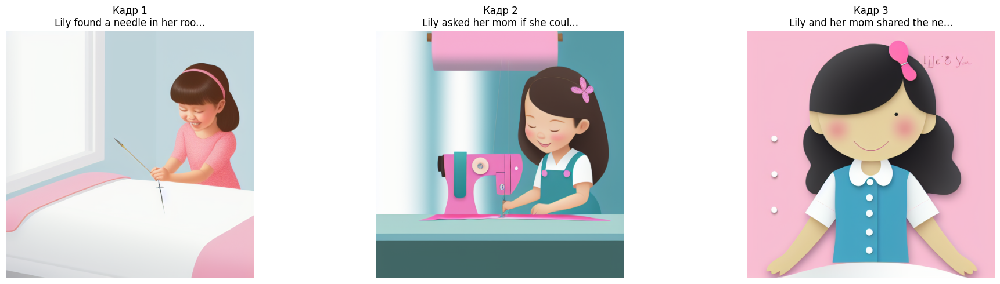

  5%|▌         | 1/20 [03:43<1:10:50, 223.73s/it]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to LCMScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


['Introduced the character "Beep" as a little car loving to drive fast and play in the sun.', "Described Beep's healthiness due to having good fuel which made him happy and strong.", "Illustrated Beep's playful interaction with falling leaves during his day at the park"]


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

История 1:
  CLIP: 0.3108 | LPIPS: 1.0000
  Текст: Introduced the character "Beep" as a little car lo...


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 2:
  CLIP: 0.2773 | LPIPS: 0.3181
  Текст: Described Beep's healthiness due to having good fu...


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 3:
  CLIP: 0.2939 | LPIPS: 0.3136
  Текст: Illustrated Beep's playful interaction with fallin...


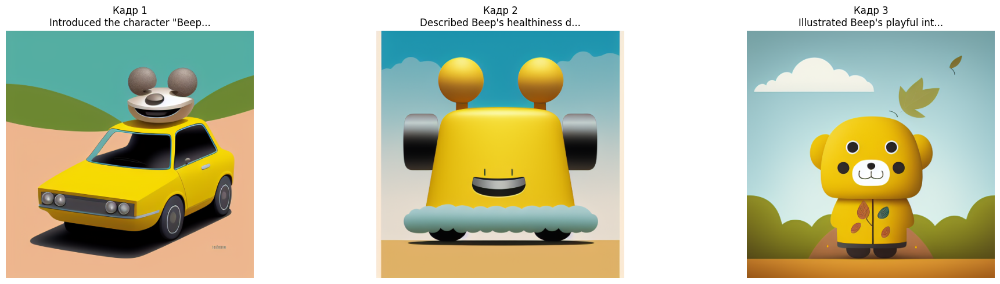

 10%|█         | 2/20 [06:47<1:00:06, 200.35s/it]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to LCMScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


['Fin saw a big crab and wanted to be friends.', 'Fin approached the crab and asked if he wanted to play.', 'The crab did not want to play because he was cold and did not feel well.']


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

История 1:
  CLIP: 0.2983 | LPIPS: 1.0000
  Текст: Fin saw a big crab and wanted to be friends....


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 2:
  CLIP: 0.2615 | LPIPS: 0.2351
  Текст: Fin approached the crab and asked if he wanted to ...


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 3:
  CLIP: 0.3018 | LPIPS: 0.2633
  Текст: The crab did not want to play because he was cold ...


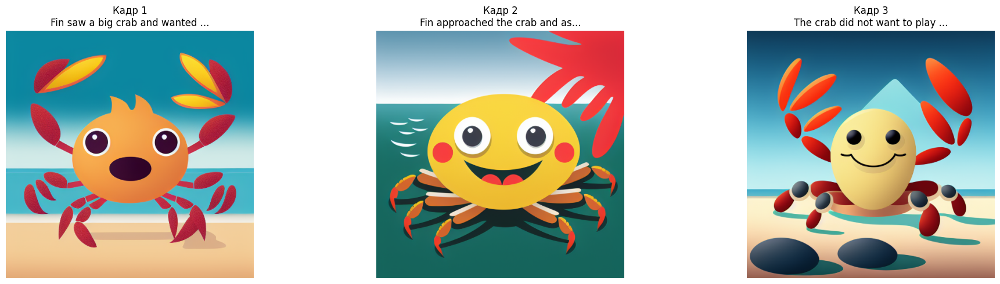

 15%|█▌        | 3/20 [09:48<54:11, 191.24s/it]  

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to LCMScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


["The cherry tree experienced envy at first due to its perceived weakness compared to others' strength.", 'A spring wind reassured the cherry tree by emphasizing its uniqueness through the aroma of its cherries.', 'With growing fruit, the cherry tree attracted new friends, leading to a sense of happiness']


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

История 1:
  CLIP: 0.3091 | LPIPS: 1.0000
  Текст: The cherry tree experienced envy at first due to i...


  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 2:
  CLIP: 0.2104 | LPIPS: 0.0450
  Текст: A spring wind reassured the cherry tree by emphasi...


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 3:
  CLIP: 0.3201 | LPIPS: -0.0483
  Текст: With growing fruit, the cherry tree attracted new ...


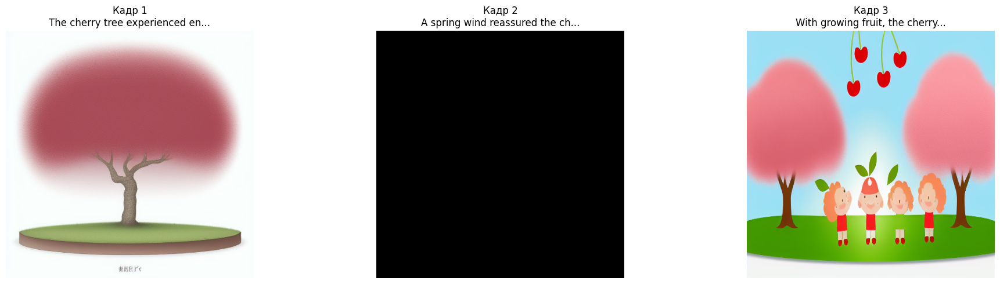

 20%|██        | 4/20 [12:48<49:51, 186.97s/it]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to LCMScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


['Lily discovered a big cobweb blocking her game.', 'Lily approached the spider living inside the cobweb.', "Lily's friends, the cat and the dog, came to help Lily remove the cobweb."]


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

История 1:
  CLIP: 0.2308 | LPIPS: 1.0000
  Текст: Lily discovered a big cobweb blocking her game....


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 2:
  CLIP: 0.3196 | LPIPS: 0.2773
  Текст: Lily approached the spider living inside the cobwe...


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 3:
  CLIP: 0.2810 | LPIPS: 0.3056
  Текст: Lily's friends, the cat and the dog, came to help ...


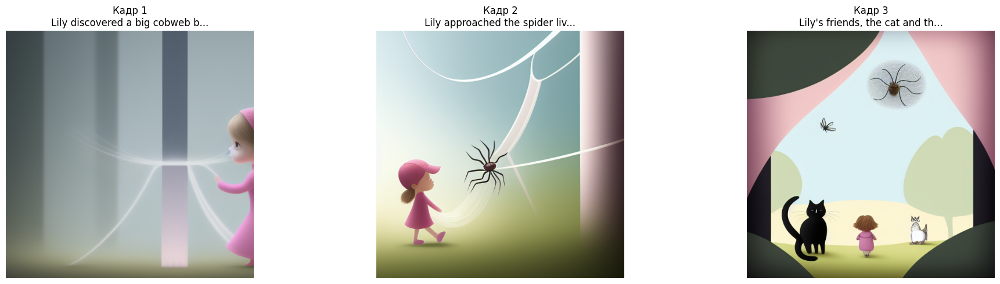

 25%|██▌       | 5/20 [15:48<46:05, 184.36s/it]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to LCMScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


['Describe the initial scene where the brown kayak is described as being in a big lake.', 'Mention that one day, a little boy named Tim came to play with the brown kayak.', 'Detail how Tim and the brown kayak enjoyed playing together by rolling and splashing in the lake.']


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

История 1:
  CLIP: 0.3013 | LPIPS: 1.0000
  Текст: Describe the initial scene where the brown kayak i...


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 2:
  CLIP: 0.2798 | LPIPS: 0.2883
  Текст: Mention that one day, a little boy named Tim came ...


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 3:
  CLIP: 0.2350 | LPIPS: 0.3312
  Текст: Detail how Tim and the brown kayak enjoyed playing...


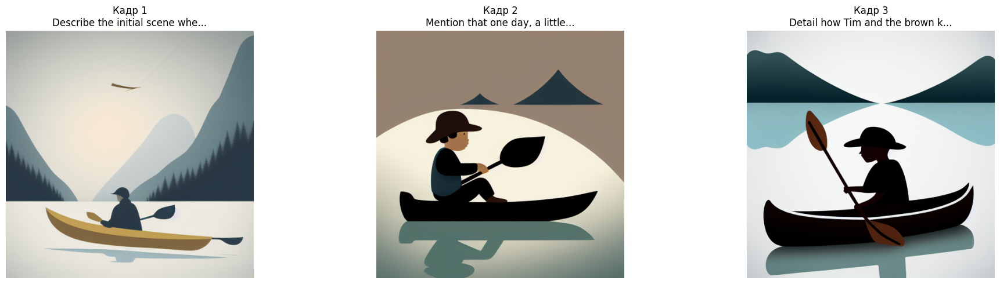

 30%|███       | 6/20 [18:48<42:39, 182.85s/it]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to LCMScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


['Lily lost her favorite triangle toy.', 'Lily searched extensively for her missing triangle.', 'While playing at the park, Lily discovered her triangle by accident in a puddle.']


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

История 1:
  CLIP: 0.2834 | LPIPS: 1.0000
  Текст: Lily lost her favorite triangle toy....


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 2:
  CLIP: 0.2722 | LPIPS: 0.5193
  Текст: Lily searched extensively for her missing triangle...


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 3:
  CLIP: 0.2225 | LPIPS: 0.3780
  Текст: While playing at the park, Lily discovered her tri...


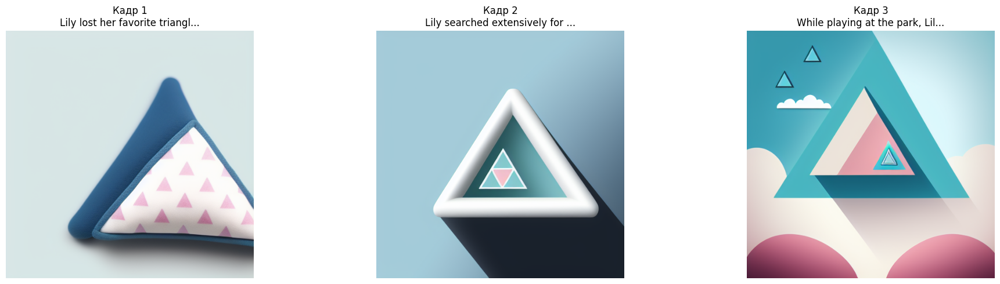

 35%|███▌      | 7/20 [21:47<39:22, 181.73s/it]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to LCMScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


['Tim sees a race in the park.', 'Tim goes to his friend, Sarah, and says, "Let\'s start the race!"', 'Tim and Sarah run with all their speed, laughing and having fun.']


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

История 1:
  CLIP: 0.2489 | LPIPS: 1.0000
  Текст: Tim sees a race in the park....


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 2:
  CLIP: 0.2269 | LPIPS: 0.2998
  Текст: Tim goes to his friend, Sarah, and says, "Let's st...


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 3:
  CLIP: 0.2429 | LPIPS: 0.2763
  Текст: Tim and Sarah run with all their speed, laughing a...


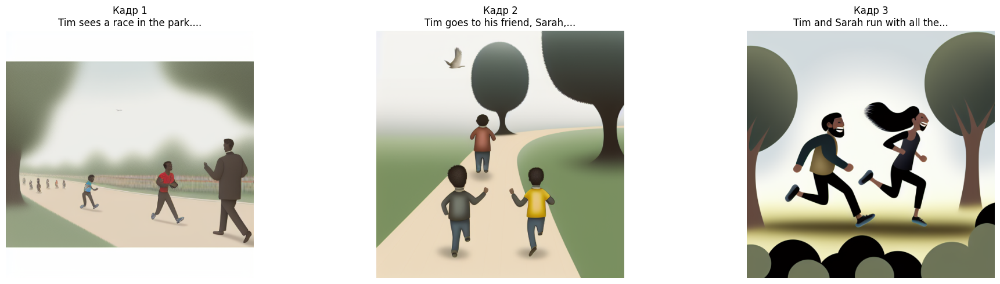

 40%|████      | 8/20 [24:47<36:13, 181.11s/it]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to LCMScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


['Max falls and injures his knee while playing in the park.', 'Max seeks advice from the wise old owl.', "Max tests his knee using the owl's suggestion and finds relief."]


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

История 1:
  CLIP: 0.2783 | LPIPS: 1.0000
  Текст: Max falls and injures his knee while playing in th...


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 2:
  CLIP: 0.2952 | LPIPS: 0.2997
  Текст: Max seeks advice from the wise old owl....


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 3:
  CLIP: 0.2585 | LPIPS: 0.3326
  Текст: Max tests his knee using the owl's suggestion and ...


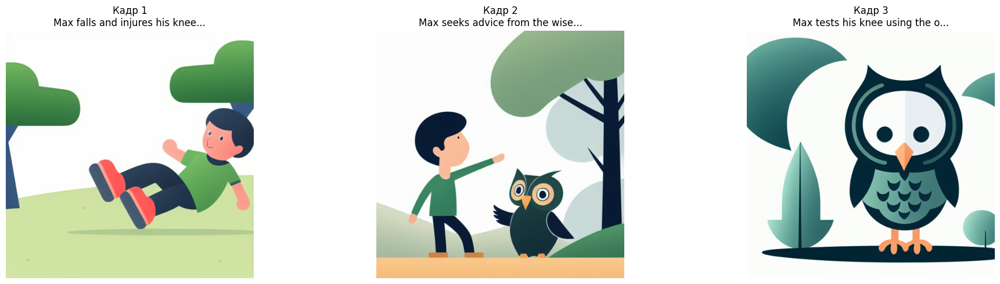

 45%|████▌     | 9/20 [27:46<33:06, 180.62s/it]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to LCMScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


['Tim goes for a ride in his loud car.', 'Tim calls on his friend Sam.', 'Sam gets in the car and they drive around the town.']


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

История 1:
  CLIP: 0.2664 | LPIPS: 1.0000
  Текст: Tim goes for a ride in his loud car....


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 2:
  CLIP: 0.2131 | LPIPS: 0.3781
  Текст: Tim calls on his friend Sam....


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 3:
  CLIP: 0.2289 | LPIPS: 0.3022
  Текст: Sam gets in the car and they drive around the town...


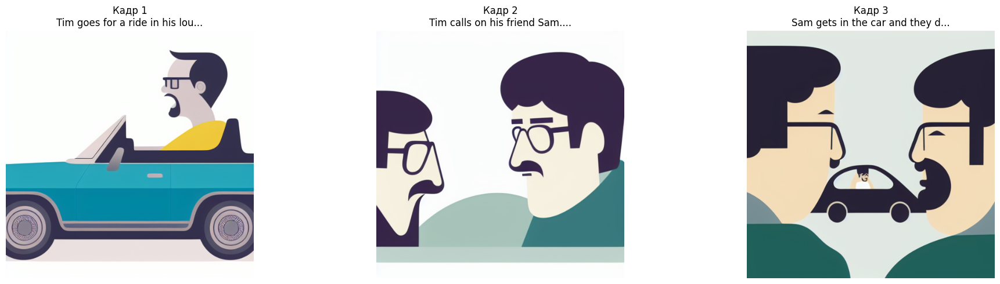

 50%|█████     | 10/20 [30:46<30:02, 180.22s/it]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to LCMScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


['The family arrives at the park.', 'They see a big sign saying "Fun Race Today!"', 'The family decides to join the race.']


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

История 1:
  CLIP: 0.2678 | LPIPS: 1.0000
  Текст: The family arrives at the park....


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 2:
  CLIP: 0.1918 | LPIPS: 0.2346
  Текст: They see a big sign saying "Fun Race Today!"...


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 3:
  CLIP: 0.2529 | LPIPS: 0.3843
  Текст: The family decides to join the race....


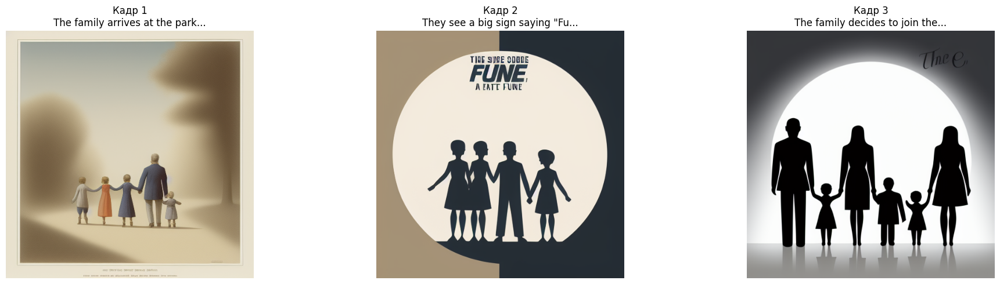

 55%|█████▌    | 11/20 [33:45<26:59, 179.95s/it]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to LCMScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


['Found a pencil', 'Wore the pencil in the hat', 'Drew pictures with the pencil']


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

История 1:
  CLIP: 0.2581 | LPIPS: 1.0000
  Текст: Found a pencil...


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 2:
  CLIP: 0.2891 | LPIPS: 0.3234
  Текст: Wore the pencil in the hat...


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 3:
  CLIP: 0.2426 | LPIPS: 0.2102
  Текст: Drew pictures with the pencil...


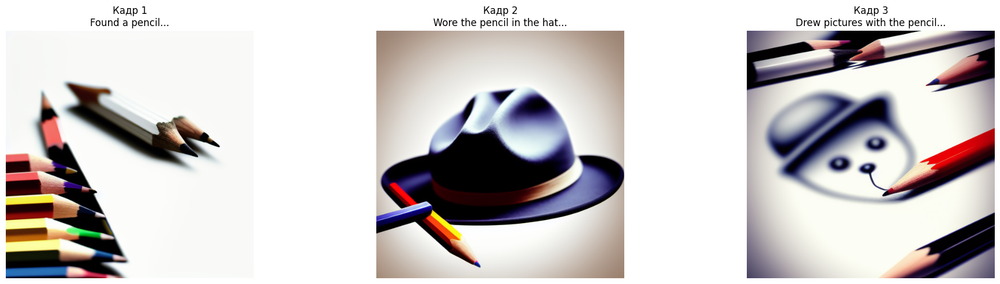

 60%|██████    | 12/20 [36:44<23:58, 179.76s/it]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to LCMScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


['Mia goes for a walk.', 'Mia sees a big, scary house.', 'Mia enters the house.']


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

История 1:
  CLIP: 0.2559 | LPIPS: 1.0000
  Текст: Mia goes for a walk....


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 2:
  CLIP: 0.2520 | LPIPS: 0.2643
  Текст: Mia sees a big, scary house....


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 3:
  CLIP: 0.2246 | LPIPS: 0.2244
  Текст: Mia enters the house....


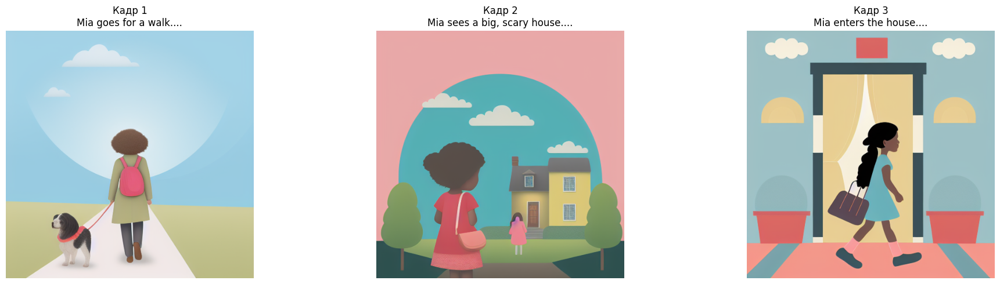

 65%|██████▌   | 13/20 [39:44<20:57, 179.62s/it]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to LCMScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


['Amy wakes up from a deep sleep, feeling tired but excited because she hears a gentle noise outside her window.', 'Amy decides to investigate what made such a peaceful sound and slowly gets out of bed, making sure to turn off all lights as she goes down the stairs.', 'As Amy']


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

История 1:
  CLIP: 0.2979 | LPIPS: 1.0000
  Текст: Amy wakes up from a deep sleep, feeling tired but ...


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 2:
  CLIP: 0.2311 | LPIPS: 0.2813
  Текст: Amy decides to investigate what made such a peacef...


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 3:
  CLIP: 0.2406 | LPIPS: 0.2474
  Текст: As Amy...


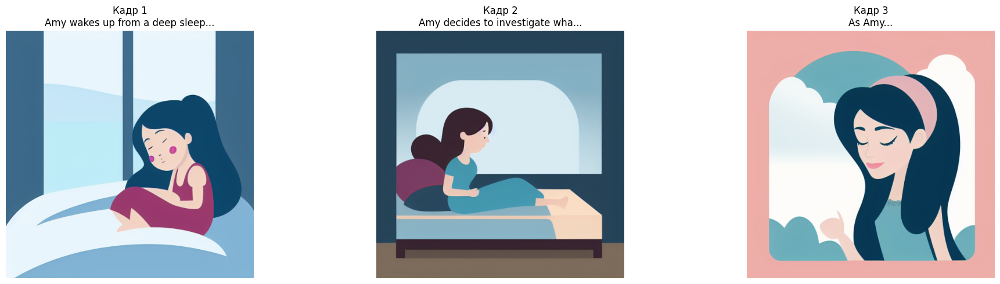

 70%|███████   | 14/20 [42:45<18:00, 180.02s/it]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to LCMScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


['The mushroom felt lonely and wanted a friend.', 'A little bunny came and the mushroom made friends with it.', 'The bunny helped the mushroom hide from the sun by digging a hole for it.']


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

История 1:
  CLIP: 0.3196 | LPIPS: 1.0000
  Текст: The mushroom felt lonely and wanted a friend....


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 2:
  CLIP: 0.2849 | LPIPS: 0.4365
  Текст: A little bunny came and the mushroom made friends ...


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 3:
  CLIP: 0.2795 | LPIPS: 0.4052
  Текст: The bunny helped the mushroom hide from the sun by...


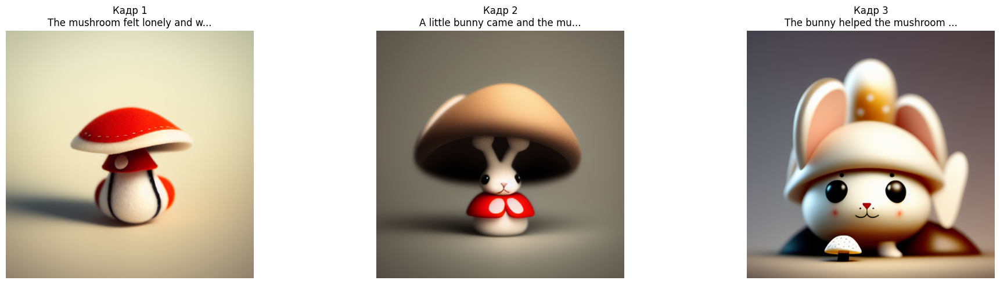

 75%|███████▌  | 15/20 [45:44<14:59, 179.94s/it]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to LCMScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


['The queen went to the park to relax.', 'The queen saw a bug.', 'The queen did not like the disgusting bug.']


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

История 1:
  CLIP: 0.2629 | LPIPS: 1.0000
  Текст: The queen went to the park to relax....


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 2:
  CLIP: 0.2764 | LPIPS: 0.2431
  Текст: The queen saw a bug....


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 3:
  CLIP: 0.2903 | LPIPS: 0.3030
  Текст: The queen did not like the disgusting bug....


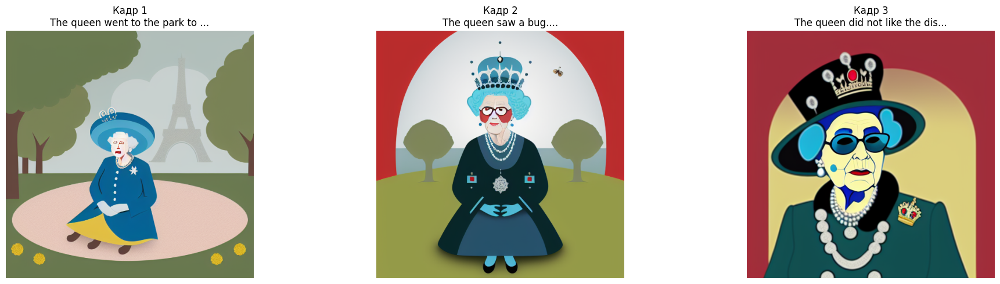

 80%|████████  | 16/20 [48:44<11:59, 179.82s/it]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to LCMScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


['The little white cat named Fluffy loves playing with her best friend, a small boy named Timmy.', 'Timmy learns a new word at school and wants to teach it to Fluffy.', 'Fluffy tries to repeat the word "repeat" but gets confused by the sound "']


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

История 1:
  CLIP: 0.3325 | LPIPS: 1.0000
  Текст: The little white cat named Fluffy loves playing wi...


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 2:
  CLIP: 0.2333 | LPIPS: 0.2857
  Текст: Timmy learns a new word at school and wants to tea...


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 3:
  CLIP: 0.2280 | LPIPS: 0.3657
  Текст: Fluffy tries to repeat the word "repeat" but gets ...


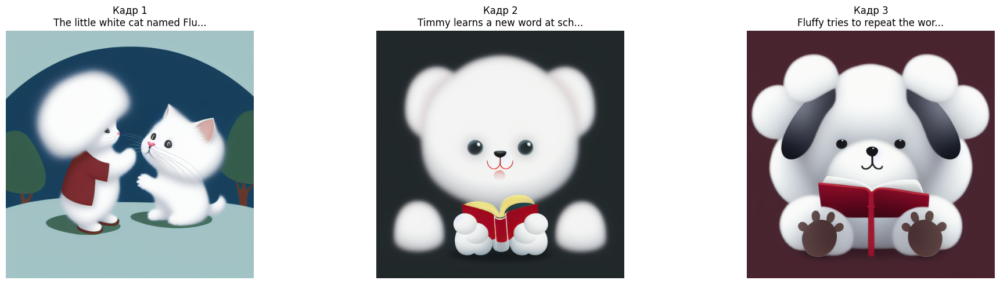

 85%|████████▌ | 17/20 [51:44<08:59, 179.95s/it]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to LCMScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


['The octopus and the fish find a big jug.', 'The octopus wants to pour the water alone while the fish wants to pour it together.', 'The octopus suggests both of them should take turns pouring the water.']


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

История 1:
  CLIP: 0.3140 | LPIPS: 1.0000
  Текст: The octopus and the fish find a big jug....


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 2:
  CLIP: 0.3115 | LPIPS: 0.2040
  Текст: The octopus wants to pour the water alone while th...


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 3:
  CLIP: 0.3137 | LPIPS: 0.2318
  Текст: The octopus suggests both of them should take turn...


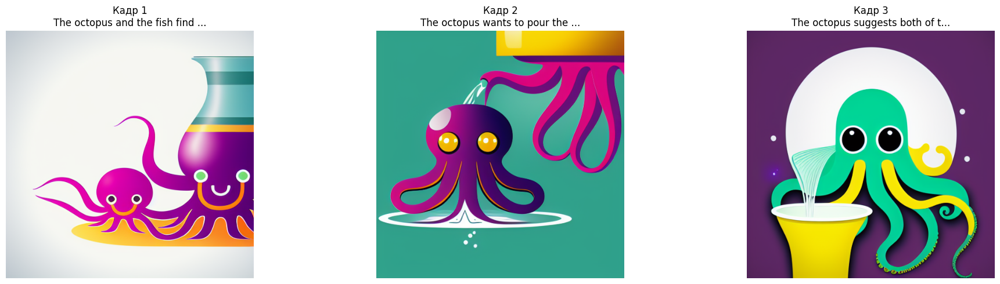

 90%|█████████ | 18/20 [54:44<06:00, 180.02s/it]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to LCMScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


['Tom found a hoop in the yard.', 'Tom decided to make the hoop smaller by stretching it.', 'Tom successfully made the hoop smaller and played with it happily.']


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

История 1:
  CLIP: 0.2754 | LPIPS: 1.0000
  Текст: Tom found a hoop in the yard....


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 2:
  CLIP: 0.2240 | LPIPS: 0.2741
  Текст: Tom decided to make the hoop smaller by stretching...


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 3:
  CLIP: 0.2463 | LPIPS: 0.3766
  Текст: Tom successfully made the hoop smaller and played ...


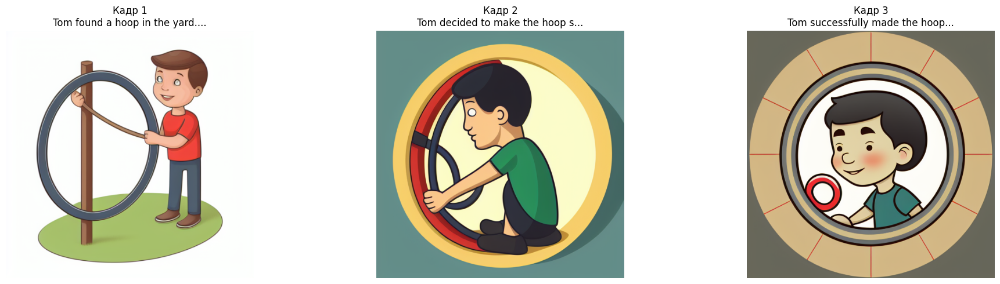

 95%|█████████▌| 19/20 [57:44<02:59, 179.86s/it]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to LCMScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


["The crab meets a new friend who doesn't know how to play.", 'The crab teaches the new friend how to play.', 'The two friends have fun together and become close friends.]']


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

История 1:
  CLIP: 0.3350 | LPIPS: 1.0000
  Текст: The crab meets a new friend who doesn't know how t...


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 2:
  CLIP: 0.3230 | LPIPS: 0.3214
  Текст: The crab teaches the new friend how to play....


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/50 [00:00<?, ?it/s]

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth
История 3:
  CLIP: 0.2798 | LPIPS: 0.3358
  Текст: The two friends have fun together and become close...


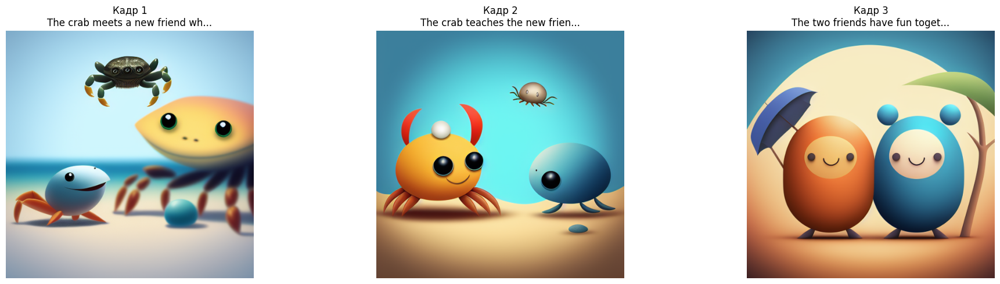

100%|██████████| 20/20 [1:00:43<00:00, 182.20s/it]


In [18]:
clip_ls = []
lpip_ls = []
for i in tqdm(range(20)):
    
    best_frames, best_clips, best_lpips = gen_img_sequential(stories[i])
    
    #save_images(best_frames, num_act=i)
    
    clip_ls.append(np.mean(best_clips))
    lpip_ls.append(np.mean(best_lpips))

In [ ]:
print('CLIP:  ',100*np.mean(clip_ls))
print('LPIPS: ',100*np.mean(lpip_ls))

CLIP:   17.051595052083332
LPIPS:  39.05018910765648
